Dataset has some nan values. In this notebook i am filling these nan values with forward filling

In [1]:
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 500)

warnings.simplefilter(action='ignore', category=Warning)

## Importing Datasets for Forward Filling

In [2]:
df_train_readouts = pd.read_csv('processed_train_operational_readouts.csv')
df_test_readouts = pd.read_csv('test_operational_readouts.csv')
df_validation_readouts = pd.read_csv('validation_operational_readouts.csv')

## Filling The Missing Values

In [3]:
df_train_readouts.isnull().sum().sum()

284234

In [4]:
df_test_readouts.isnull().sum().sum()

66403

In [5]:
df_validation_readouts.isnull().sum().sum()

60339

In [6]:
def fill_missing_values_with_forward_fill(df):
    """
    Eksik değerleri forward filling yöntemi ile doldurur.

    Parametre:
        df (pd.DataFrame): Eksik değerler içeren DataFrame

    Geri Dönüş:
        pd.DataFrame: Eksik değerleri doldurulmuş DataFrame
    """
    df_filled = df.copy()

    # Forward fill uyguluyoruz
    df_filled = df_filled.ffill(axis=0)

    return df_filled

In [7]:
forward_filled_df_train_readouts = fill_missing_values_with_forward_fill(df_train_readouts)

In [8]:
forward_filled_df_train_readouts.isnull().sum().sum()

0

In [9]:
forward_filled_df_train_readouts.to_csv('filled_train_operational_readouts.csv', index=False)
print("Başarılı")

Başarılı


In [10]:
forward_filled_df_test_readouts = fill_missing_values_with_forward_fill(df_test_readouts)

In [11]:
forward_filled_df_test_readouts.isnull().sum().sum()

0

In [12]:
forward_filled_df_test_readouts.to_csv('filled_test_operational_readouts.csv', index=False)
print("Başarılı")

Başarılı


In [13]:
forward_filled_df_validation_readouts = fill_missing_values_with_forward_fill(df_validation_readouts)

In [14]:
forward_filled_df_validation_readouts.isnull().sum().sum()

0

In [15]:
forward_filled_df_validation_readouts.to_csv('filled_validation_operational_readouts.csv', index=False)
print("Başarılı")

Başarılı


## Selecting High Correlated Colomns

In [2]:
def high_correlated_cols(dataframe, plot=False, corr_th=0.85):
    float_cols = [col for col in dataframe.columns if dataframe[col].dtype == np.float64]
    numeric_df = dataframe[float_cols]
    numeric_df = numeric_df.drop(columns=['time_step'], errors='ignore')

    corr = numeric_df.corr()
    cor_matrix = corr.abs()
    
    upper_triangle_matrix = cor_matrix.where(np.triu(np.ones(cor_matrix.shape), k=1).astype(bool))
    
    drop_list = [col for col in upper_triangle_matrix.columns if any(upper_triangle_matrix[col] > corr_th)]
    
    if plot:
        num_cols = len(numeric_df.columns)
        fig_size = (num_cols * 0.5, num_cols * 0.3)  # Dynamically adjust size based on number of columns
        fig, ax = plt.subplots(figsize=fig_size) 
        sns.heatmap(numeric_df.corr(), annot=True, linewidths=.5, ax=ax)
        plt.show()
    
    return drop_list


### Importing Datasets for Correlation Matrix

In [3]:
df_filled_train_readouts = pd.read_csv('filled_train_operational_readouts.csv')
df_filled_test_readouts = pd.read_csv('filled_test_operational_readouts.csv')
df_filled_validation_readouts = pd.read_csv('filled_validation_operational_readouts.csv')

In [4]:
df_filled_train_readouts.isnull().sum().sum()

0

In [5]:
df_filled_test_readouts.isnull().sum().sum()

0

In [6]:
df_filled_validation_readouts.isnull().sum().sum()

0

### Examine The Correlation Between The Columns

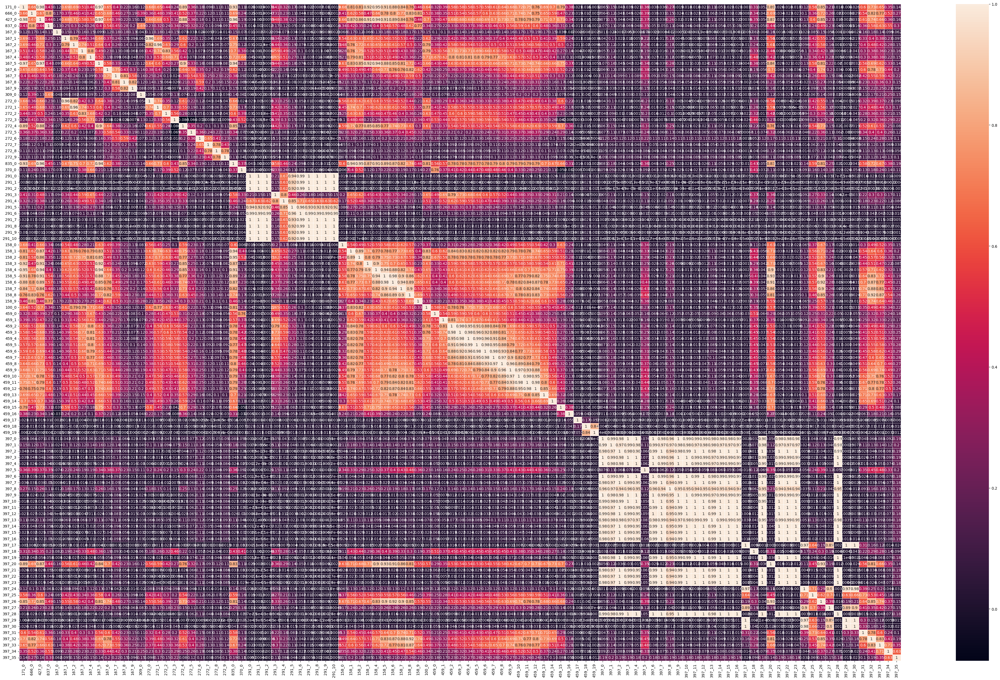

In [7]:
high_correlated_cols_train = high_correlated_cols(df_filled_train_readouts, plot=True)
# 58 column was selected when cor_th = 0.9

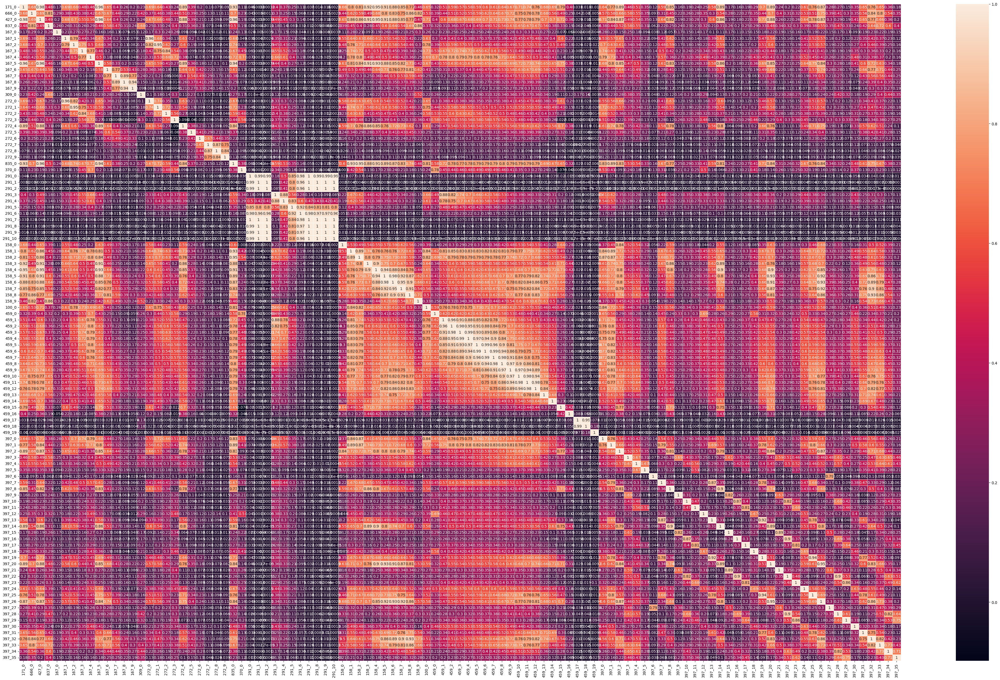

In [8]:
high_correlated_cols_test = high_correlated_cols(df_filled_test_readouts, plot=True)
# 41 column was selected when cor_th = 0.9

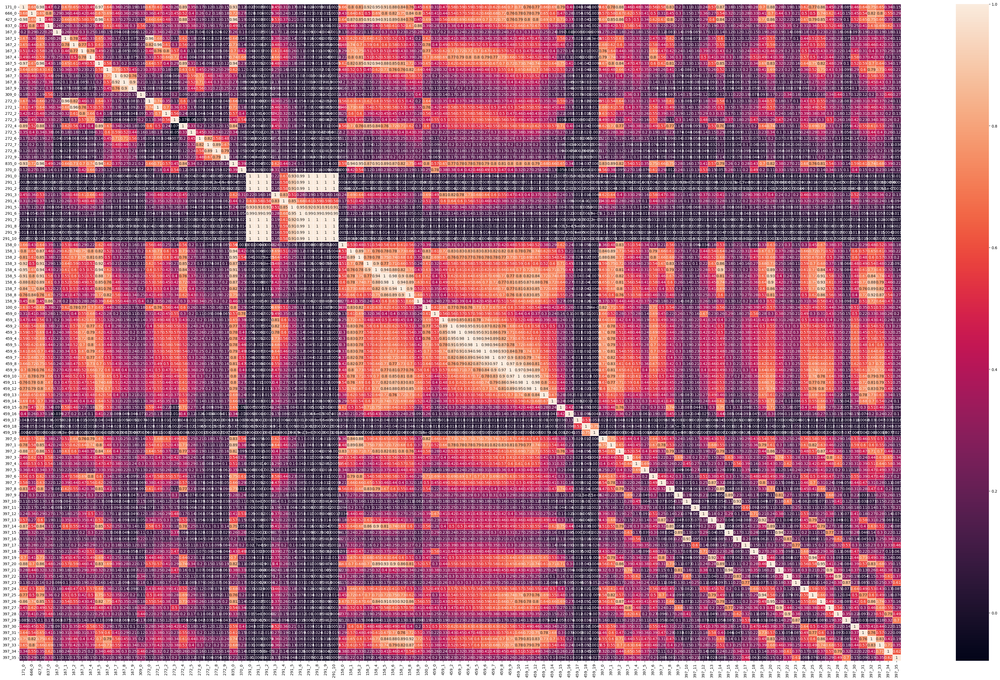

In [9]:
high_correlated_cols_validation = high_correlated_cols(df_filled_validation_readouts, plot=True)
# 41 column was selected when cor_th = 0.9

In [10]:
common_cols = [col for col in high_correlated_cols_train if (col in high_correlated_cols_test) and (col in high_correlated_cols_validation)]

In [11]:
len(common_cols)

44

In [12]:
common_cols

['427_0',
 '167_5',
 '272_0',
 '272_1',
 '272_4',
 '835_0',
 '291_1',
 '291_2',
 '291_6',
 '291_7',
 '291_8',
 '291_9',
 '291_10',
 '158_1',
 '158_2',
 '158_3',
 '158_4',
 '158_5',
 '158_6',
 '158_7',
 '158_8',
 '459_3',
 '459_4',
 '459_5',
 '459_6',
 '459_7',
 '459_8',
 '459_9',
 '459_10',
 '459_11',
 '459_12',
 '397_1',
 '397_2',
 '397_13',
 '397_14',
 '397_16',
 '397_19',
 '397_20',
 '397_21',
 '397_26',
 '397_28',
 '397_29',
 '397_32',
 '397_33']

In [13]:
df_filled_train_readouts.drop(columns=common_cols, inplace=True)
df_filled_train_readouts.head()

,vehicle_id,time_step,171_0,666_0,837_0,167_0,167_1,167_2,167_3,167_4,167_6,167_7,167_8,167_9,309_0,272_2,272_3,272_5,272_6,272_7,272_8,272_9,370_0,291_0,291_3,291_4,291_5,158_0,158_9,100_0,459_0,459_1,459_2,459_13,459_14,459_15,459_16,459_17,459_18,459_19,397_0,397_3,397_4,397_5,397_6,397_7,397_8,397_9,397_10,397_11,397_12,397_15,397_17,397_18,397_22,397_23,397_24,397_25,397_27,397_30,397_31,397_34,397_35
0,0,11.2,167985.0,10787.0,2296.0,4110.0,1296420.0,1628265.0,630345.0,1269525.0,2706706.0,222225.0,6240.0,0.0,70.0,384579.0,668642.0,398490.0,3887.0,0.0,0.0,0.0,0.0,1227.0,925.0,468.0,225.0,97056.0,505693.0,858410.0,203.676778,111.911500,147.265389,1272.323972,1847.623667,940.785694,2.900083,0.208444,0.056417,0.058444,446956.0,26636.0,29156.0,7616.0,449537.0,233352.0,139920.0,12648.0,2813.0,224.0,53161.0,13328.0,88.0,16361.0,2856.0,48.0,6337.0,105412.0,15609.0,784.0,150228.0,17874.0,452.0
1,0,11.4,167985.0,10787.0,2296.0,4111.0,1302855.0,1628265.0,630345.0,1269526.0,2706706.0,222225.0,6240.0,0.0,70.0,384579.0,668642.0,398490.0,3887.0,0.0,0.0,0.0,0.0,1230.0,925.0,469.0,226.0,97056.0,505693.0,860571.0,204.256750,112.924250,147.265389,1272.323972,1847.623667,940.785694,2.900083,0.208444,0.056417,0.058444,446964.0,26638.0,29157.0,7616.0,451193.0,233354.0,139920.0,12649.0,2813.0,224.0,53210.0,13328.0,88.0,16368.0,2856.0,48.0,6339.0,105413.0,15610.0,784.0,150228.0,17874.0,452.0
2,0,19.6,331635.0,14525.0,2600.0,4111.0,1302855.0,1628265.0,630345.0,1269526.0,2706706.0,222225.0,6240.0,0.0,70.0,598351.0,1167062.0,460240.0,3887.0,0.0,0.0,0.0,0.0,2136.0,1420.0,722.0,412.0,181632.0,574045.0,1379191.0,321.671972,157.312500,193.792833,2140.037472,5046.748278,1151.010139,3.320194,0.218806,0.056778,0.058444,756665.0,30967.0,31213.0,7745.0,633790.0,423395.0,271940.0,16190.0,3573.0,232.0,75038.0,17325.0,92.0,24028.0,3476.0,48.0,12055.0,167693.0,19263.0,1420.0,204832.0,19306.0,452.0
3,0,20.2,354975.0,15015.0,2616.0,4111.0,1302855.0,1628265.0,630345.0,1269526.0,2706706.0,222225.0,6240.0,0.0,70.0,634595.0,1233908.0,466753.0,3887.0,0.0,0.0,0.0,0.0,2218.0,1471.0,749.0,425.0,193728.0,576901.0,1428606.0,331.479028,162.731639,198.104472,2208.782833,5587.856667,1160.593833,3.336417,0.218806,0.056778,0.058444,812577.0,31927.0,31488.0,7749.0,651902.0,478279.0,292109.0,16755.0,3753.0,232.0,77118.0,17941.0,92.0,25164.0,3573.0,48.0,13199.0,176596.0,19832.0,1444.0,211688.0,19406.0,453.0
4,0,21.0,365550.0,15295.0,2720.0,4111.0,1302855.0,1628265.0,630345.0,1269526.0,2706706.0,222225.0,6240.0,0.0,70.0,639587.0,1266369.0,474047.0,3887.0,0.0,0.0,0.0,0.0,2272.0,1519.0,773.0,440.0,203568.0,587234.0,1460547.0,339.563444,166.705583,202.430194,2307.900278,5738.170167,1182.611833,3.367250,0.218806,0.056778,0.058444,843929.0,32585.0,31896.0,7773.0,665154.0,488271.0,300083.0,17265.0,3998.0,232.0,79222.0,18614.0,92.0,25736.0,3641.0,52.0,13400.0,183724.0,20573.0,1445.0,213956.0,19535.0,454.0


In [15]:
df_filled_train_readouts.isnull().sum().sum()

0

In [14]:
df_filled_train_readouts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 919998 entries, 0 to 919997
Data columns (total 63 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   vehicle_id  919998 non-null  int64  
 1   time_step   919998 non-null  float64
 2   171_0       919998 non-null  float64
 3   666_0       919998 non-null  float64
 4   837_0       919998 non-null  float64
 5   167_0       919998 non-null  float64
 6   167_1       919998 non-null  float64
 7   167_2       919998 non-null  float64
 8   167_3       919998 non-null  float64
 9   167_4       919998 non-null  float64
 10  167_6       919998 non-null  float64
 11  167_7       919998 non-null  float64
 12  167_8       919998 non-null  float64
 13  167_9       919998 non-null  float64
 14  309_0       919998 non-null  float64
 15  272_2       919998 non-null  float64
 16  272_3       919998 non-null  float64
 17  272_5       919998 non-null  float64
 18  272_6       919998 non-null  float64
 19  27

In [16]:
df_filled_train_readouts.to_csv('selected_and_filled_train_operational_readouts.csv', index=False)
print("Başarılı")

Başarılı


In [17]:
df_filled_test_readouts.drop(columns=common_cols, inplace=True)
df_filled_test_readouts.head()

,vehicle_id,time_step,171_0,666_0,837_0,167_0,167_1,167_2,167_3,167_4,167_6,167_7,167_8,167_9,309_0,272_2,272_3,272_5,272_6,272_7,272_8,272_9,370_0,291_0,291_3,291_4,291_5,158_0,158_9,100_0,459_0,459_1,459_2,459_13,459_14,459_15,459_16,459_17,459_18,459_19,397_0,397_3,397_4,397_5,397_6,397_7,397_8,397_9,397_10,397_11,397_12,397_15,397_17,397_18,397_22,397_23,397_24,397_25,397_27,397_30,397_31,397_34,397_35
0,1,4.4,94410.0,7982.0,2625.0,1304.0,366624.0,232040.0,147104.0,422728.0,223425.0,55640.0,8816.0,3449.0,35.0,107063.0,255684.0,173097.0,6589.0,0.0,0.0,0.0,23994.0,328.0,329.0,104.0,48.0,132118.0,230483.0,232410.0,199.198833,54.364944,45.376778,499.586222,801.094944,3222.756944,2.499500,0.111111,0.019500,0.000000,263249.0,26432.0,21462.0,2674.0,409690.0,144340.0,519841.0,5432.0,1408.0,77.0,53152.0,5194.0,63.0,8961.0,952.0,14.0,5489.0,29540.0,9696.0,399.0,31843.0,5112.0,7.0
1,1,5.0,105405.0,9178.0,3225.0,1305.0,390896.0,252528.0,157824.0,449489.0,253593.0,67992.0,11048.0,3449.0,60.0,118129.0,267289.0,202841.0,6589.0,0.0,0.0,0.0,25893.0,342.0,345.0,113.0,48.0,158088.0,272595.0,249265.0,214.559444,57.916778,49.396222,581.277500,895.922444,3680.537111,3.353833,0.157056,0.021611,0.005111,293265.0,31124.0,26328.0,3465.0,437361.0,152455.0,547904.0,5839.0,1569.0,105.0,57192.0,5866.0,70.0,9713.0,1113.0,14.0,6177.0,33769.0,12042.0,455.0,35749.0,5420.0,7.0
2,1,8.2,214440.0,23348.0,8010.0,4897.0,461240.0,378264.0,313016.0,798401.0,799497.0,163376.0,20440.0,5017.0,80.0,232683.0,542839.0,554632.0,12672.0,0.0,0.0,0.0,71100.0,472.0,591.0,182.0,78.0,346542.0,777365.0,387619.0,318.877389,94.245667,88.157389,1346.736667,2173.208889,7345.113111,7.363278,0.338889,0.034333,0.005111,593909.0,77997.0,69308.0,10136.0,626054.0,282383.0,830984.0,11293.0,3179.0,336.0,76239.0,13000.0,168.0,16461.0,2702.0,77.0,12722.0,75447.0,26099.0,1120.0,94017.0,16655.0,14.0
3,1,9.8,260190.0,29120.0,12525.0,6513.0,493728.0,455352.0,363984.0,964913.0,1108041.0,244696.0,30504.0,11025.0,220.0,268367.0,691548.0,790703.0,27885.0,0.0,0.0,0.0,87669.0,573.0,711.0,218.0,118.0,433888.0,988471.0,469672.0,370.512500,117.276333,108.131556,1655.661556,2620.414278,8583.914889,8.950778,0.371833,0.060500,0.005111,814948.0,101867.0,89779.0,13272.0,669538.0,356870.0,918373.0,14647.0,4726.0,462.0,83316.0,16738.0,252.0,19765.0,3473.0,91.0,15389.0,94651.0,32708.0,1498.0,118349.0,24054.0,35.0
4,1,20.6,519780.0,57967.0,32130.0,7617.0,665120.0,818912.0,664784.0,1708897.0,2859985.0,667753.0,80960.0,23497.0,1180.0,481646.0,1142878.0,2195096.0,77561.0,0.0,0.0,0.0,191889.0,955.0,1505.0,506.0,284.0,880978.0,1767180.0,887810.0,634.699556,232.682056,234.007167,3411.656444,5586.693333,16979.077333,17.756722,0.836667,0.110778,0.005111,1980371.0,210110.0,192966.0,26530.0,946591.0,696566.0,1612810.0,30182.0,10271.0,981.0,117063.0,34078.0,609.0,40114.0,10655.0,203.0,32750.0,191692.0,61122.0,3788.0,222712.0,59636.0,639.0


In [18]:
df_filled_test_readouts.isnull().sum().sum()

0

In [19]:
df_filled_test_readouts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198140 entries, 0 to 198139
Data columns (total 63 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   vehicle_id  198140 non-null  int64  
 1   time_step   198140 non-null  float64
 2   171_0       198140 non-null  float64
 3   666_0       198140 non-null  float64
 4   837_0       198140 non-null  float64
 5   167_0       198140 non-null  float64
 6   167_1       198140 non-null  float64
 7   167_2       198140 non-null  float64
 8   167_3       198140 non-null  float64
 9   167_4       198140 non-null  float64
 10  167_6       198140 non-null  float64
 11  167_7       198140 non-null  float64
 12  167_8       198140 non-null  float64
 13  167_9       198140 non-null  float64
 14  309_0       198140 non-null  float64
 15  272_2       198140 non-null  float64
 16  272_3       198140 non-null  float64
 17  272_5       198140 non-null  float64
 18  272_6       198140 non-null  float64
 19  27

In [20]:
df_filled_test_readouts.to_csv('selected_and_filled_test_operational_readouts.csv', index=False)
print("Başarılı")

Başarılı


In [21]:
df_filled_validation_readouts.drop(columns=common_cols, inplace=True)
df_filled_validation_readouts.head()

,vehicle_id,time_step,171_0,666_0,837_0,167_0,167_1,167_2,167_3,167_4,167_6,167_7,167_8,167_9,309_0,272_2,272_3,272_5,272_6,272_7,272_8,272_9,370_0,291_0,291_3,291_4,291_5,158_0,158_9,100_0,459_0,459_1,459_2,459_13,459_14,459_15,459_16,459_17,459_18,459_19,397_0,397_3,397_4,397_5,397_6,397_7,397_8,397_9,397_10,397_11,397_12,397_15,397_17,397_18,397_22,397_23,397_24,397_25,397_27,397_30,397_31,397_34,397_35
0,10,3.0,46590.0,3696.0,1450.0,0.0,273826.0,339584.0,99834.0,250922.0,357113.0,27034.0,2198.0,0.0,70.0,12900.0,20960.0,12725.0,124.0,0.0,0.0,0.0,0.0,712.0,569.0,208.0,48.0,21240.0,99001.0,165052.0,120.700139,40.085208,47.315069,604.575694,1479.010764,1283.698611,406.370972,0.191319,0.000000,0.005625,344190.0,12510.0,11610.0,2040.0,450781.0,134895.0,368565.0,7065.0,1261.0,30.0,27616.0,7380.0,30.0,9181.0,1110.0,15.0,6496.0,74880.0,8026.0,495.0,91665.0,9362.0,0.0
1,10,7.4,127110.0,16716.0,4660.0,0.0,635642.0,609742.0,288036.0,781775.0,1715785.0,82866.0,2198.0,0.0,70.0,27098.0,56310.0,57347.0,124.0,0.0,0.0,0.0,0.0,1648.0,1601.0,801.0,409.0,54936.0,405307.0,496081.0,344.130486,216.756250,324.007569,2520.997153,4089.285139,1881.583194,443.728542,0.384444,0.010972,0.006667,1259850.0,88172.0,85561.0,15570.0,1180141.0,429137.0,612150.0,37126.0,9346.0,616.0,97877.0,45165.0,345.0,39304.0,9840.0,345.0,25368.0,229531.0,44312.0,2265.0,414180.0,63167.0,1005.0
2,10,8.0,144015.0,19596.0,5230.0,0.0,654780.0,665756.0,300174.0,836039.0,2067521.0,100184.0,2198.0,0.0,70.0,29612.0,61306.0,63359.0,124.0,0.0,0.0,0.0,0.0,1736.0,1753.0,818.0,417.0,62064.0,485389.0,537817.0,367.498333,235.925972,352.601319,2904.826597,4605.936458,2142.888542,473.712986,0.621667,0.058333,0.008472,1462831.0,102558.0,96211.0,19351.0,1226987.0,468723.0,640155.0,41372.0,10576.0,751.0,105692.0,49711.0,375.0,43144.0,11010.0,375.0,28173.0,271081.0,52203.0,2415.0,487080.0,77477.0,1500.0
3,10,12.0,187560.0,24264.0,7420.0,2647.0,831628.0,794332.0,360066.0,955781.0,2799091.0,240002.0,10864.0,0.0,77.0,34672.0,69648.0,90503.0,528.0,0.0,0.0,0.0,0.0,2081.0,2113.0,1026.0,458.0,89406.0,693181.0,634061.0,433.936667,276.401389,399.583472,3608.536806,6521.322847,2875.241458,504.678889,0.625556,0.058333,0.008472,1890256.0,118353.0,121159.0,47431.0,1378562.0,532788.0,758476.0,48468.0,12136.0,886.0,128462.0,57466.0,420.0,53539.0,12946.0,375.0,33513.0,321694.0,61399.0,2610.0,655620.0,99587.0,1591.0
4,10,12.2,187575.0,24264.0,7420.0,2647.0,831628.0,794332.0,360066.0,955781.0,2799091.0,240002.0,10864.0,0.0,77.0,34672.0,69648.0,90504.0,528.0,0.0,0.0,0.0,0.0,2081.0,2113.0,1026.0,458.0,89406.0,693182.0,634062.0,434.936667,276.401389,399.583472,3609.536806,6522.322847,2875.241458,505.678889,0.625556,0.058333,0.008472,1890256.0,118355.0,121159.0,47431.0,1378562.0,532788.0,758478.0,48470.0,12137.0,886.0,128462.0,57467.0,420.0,53539.0,12946.0,375.0,33514.0,321694.0,61400.0,2611.0,655620.0,99588.0,1592.0


In [22]:
df_filled_validation_readouts.isnull().sum().sum()

0

In [23]:
df_filled_validation_readouts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196227 entries, 0 to 196226
Data columns (total 63 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   vehicle_id  196227 non-null  int64  
 1   time_step   196227 non-null  float64
 2   171_0       196227 non-null  float64
 3   666_0       196227 non-null  float64
 4   837_0       196227 non-null  float64
 5   167_0       196227 non-null  float64
 6   167_1       196227 non-null  float64
 7   167_2       196227 non-null  float64
 8   167_3       196227 non-null  float64
 9   167_4       196227 non-null  float64
 10  167_6       196227 non-null  float64
 11  167_7       196227 non-null  float64
 12  167_8       196227 non-null  float64
 13  167_9       196227 non-null  float64
 14  309_0       196227 non-null  float64
 15  272_2       196227 non-null  float64
 16  272_3       196227 non-null  float64
 17  272_5       196227 non-null  float64
 18  272_6       196227 non-null  float64
 19  27

In [24]:
df_filled_validation_readouts.to_csv('selected_and_filled_validation_operational_readouts.csv', index=False)
print("Başarılı")

Başarılı
